In [20]:
# Install required packages (if needed)
#%pip install torch torchvision tqdm numpy scipy pillow matplotlib

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as nd
from tqdm import tqdm
import os


Using device: cuda
GPU: NVIDIA GeForce RTX 4080 SUPER


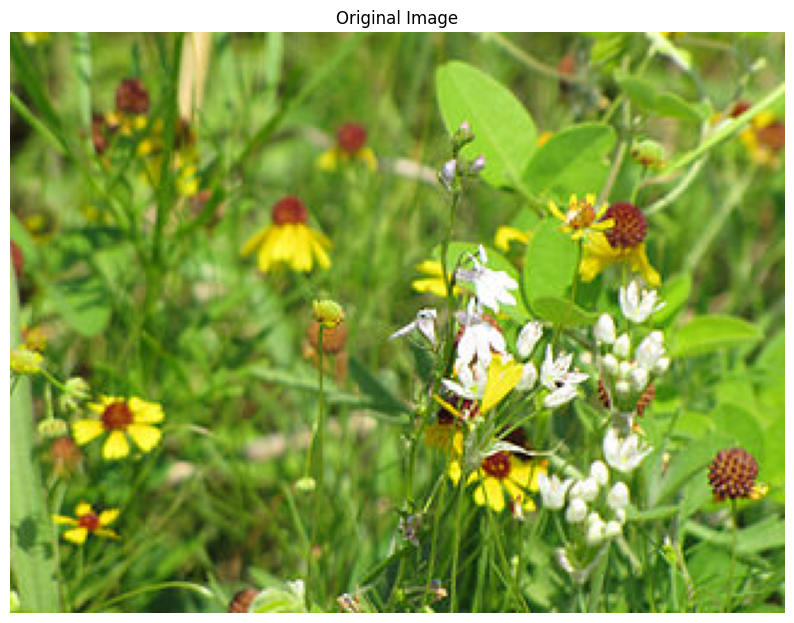

/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [21]:
# Import our DeepDream implementation
# Make sure deepdream_simple.py is in the same directory
from deepdream_simple import DeepDreamModel, deep_dream

# Set up plotting
plt.rcParams['figure.figsize'] = (12, 8)

# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Load an image (you may need to change the path)
img_path = './img/flowers.jpg'  # Change to your image path
img = np.array(Image.open(img_path).convert('RGB'))

# Display the original image
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')
plt.show()

# Initialize the DeepDream model
dreamer = DeepDreamModel()


In [22]:
# List the available layers that we can use
print("Available layers for dreaming:")
for layer in sorted(dreamer.outputs.keys()):
    print(f"- {layer}")

def display_dream(image_array, title):
    """Helper function to display dream images"""
    plt.figure(figsize=(10, 8))
    plt.imshow(image_array)
    plt.title(title)
    plt.axis('off')
    plt.show()

Available layers for dreaming:



Processing layer inception_3b/output...
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 65.26it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 102.56it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 118.03it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 117.41it/s]


Dream image saved to ./results/dream_inception_3b_output.jpg


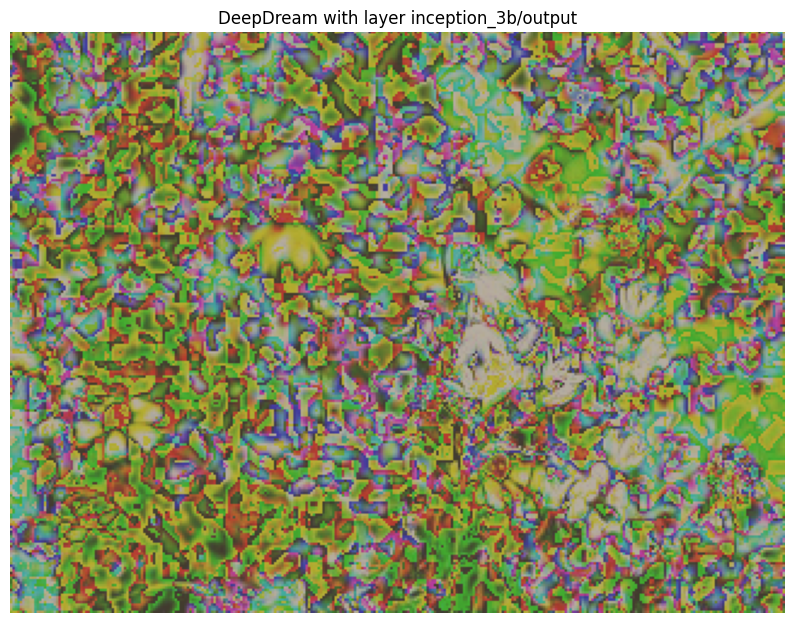


Processing layer inception_4c/output...
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 117.49it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 111.18it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 82.62it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 115.25it/s]


Dream image saved to ./results/dream_inception_4c_output.jpg


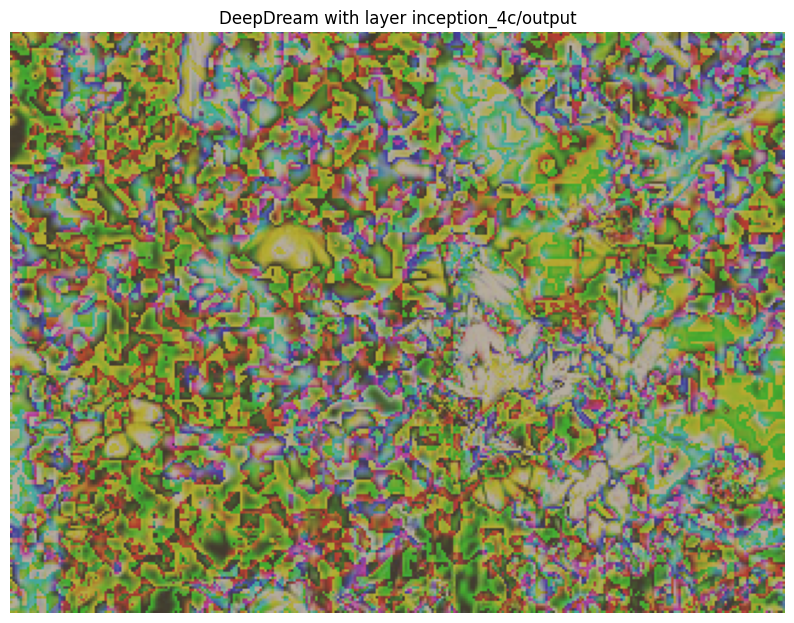


Processing layer inception_5a/output...
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 85.99it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 88.05it/s]

Processing octave 3/4 - resolution: 171x229



100%|██████████| 5/5 [00:00<00:00, 79.07it/s]

Processing octave 4/4 - resolution: 240x320



100%|██████████| 5/5 [00:00<00:00, 70.70it/s]


Dream image saved to ./results/dream_inception_5a_output.jpg


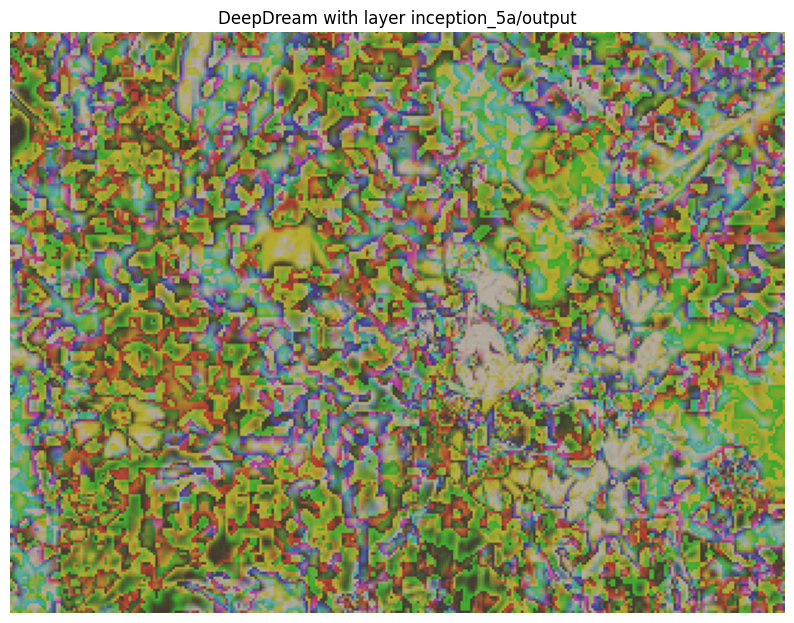

In [23]:
# Test different layers
layer_examples = [
    'inception_3b/output',  # Lower layer
    'inception_4c/output',  # Default layer
    'inception_5a/output'   # Higher layer
]

for layer in layer_examples:
    print(f"\nProcessing layer {layer}...")
    result = deep_dream(
        img_path, 
        output_path=f"./results/dream_{layer.replace('/', '_')}.jpg",
        layer=layer,
        octave_n=4,  # Use fewer octaves for notebook example (faster)
        iterations=5  # Use fewer iterations for notebook example (faster)
    )
    
    # Display the result
    display_dream(np.array(result), f"DeepDream with layer {layer}")

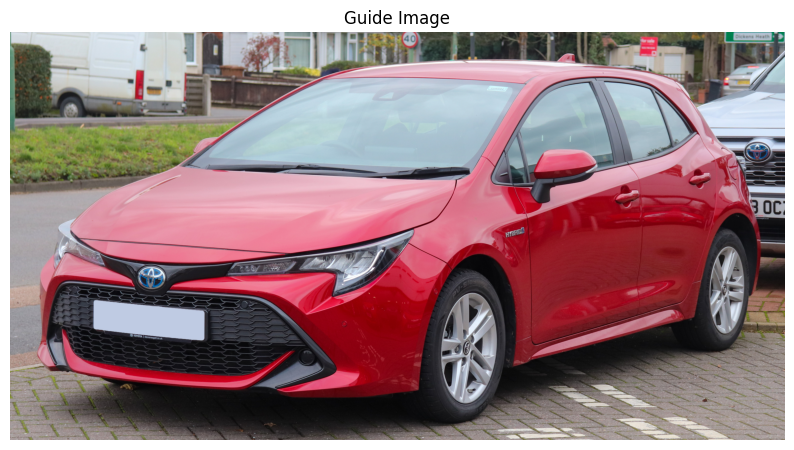

Processing guided dream...
Input image shape: (240, 320, 3)
Using guide image: ./img/car.jpg
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 106.17it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 133.99it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 104.36it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 62.88it/s]


Dream image saved to guided_dream.jpg


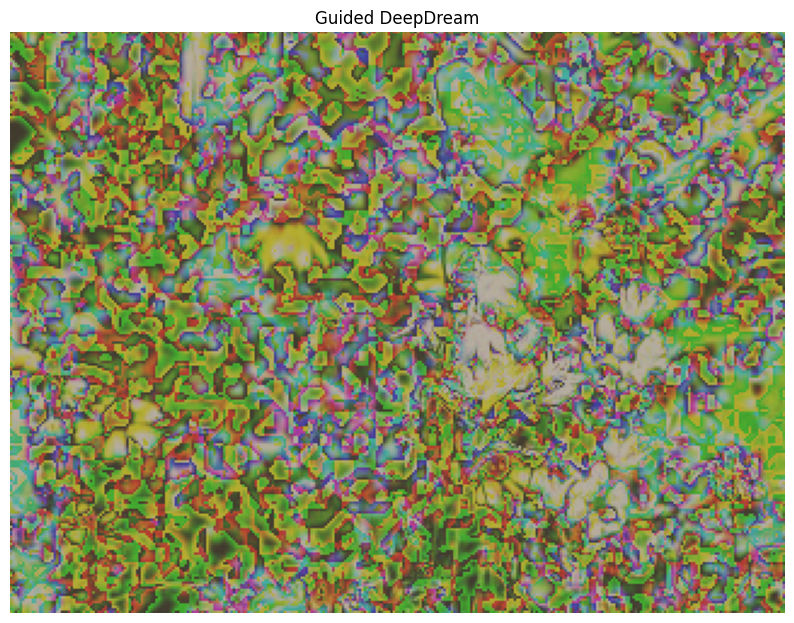

In [24]:
# Load a guide image (adjust the path as needed)
guide_path = './img/car.jpg'

try:
    guide_img = np.array(Image.open(guide_path).convert('RGB'))
    
    # Display the guide image
    plt.figure(figsize=(10, 8))
    plt.imshow(guide_img)
    plt.title('Guide Image')
    plt.axis('off')
    plt.show()
    
    # Apply guided dreaming
    print("Processing guided dream...")
    guided_result = deep_dream(
        img_path, 
        output_path="guided_dream.jpg",
        layer='inception_3b/output',
        octave_n=4,
        iterations=5,
        guide_path=guide_path
    )
    
    # Display the result
    display_dream(np.array(guided_result), "Guided DeepDream")
    
except FileNotFoundError:
    print(f"Guide image {guide_path} not found. Skipping guided dream example.")

In [25]:
# Create a short animation (with fewer frames for the notebook example)
print("Creating a short animation...")

# Create output directory
frames_dir = 'notebook_frames'
os.makedirs(frames_dir, exist_ok=True)

# Start with original image
frame = img.copy()
h, w = frame.shape[:2]
s = 0.05  # scale coefficient

# Keep track of frames for display in notebook
animation_frames = []

# Just create 5 frames for demonstration (original used 100)
for i in range(5):
    print(f"Processing frame {i+1}/5")
    
    # Apply DeepDream
    result = deep_dream(
        frame, 
        output_path=f"{frames_dir}/frame_{i:04d}.jpg",
        layer='inception_4c/output',
        octave_n=4,
        iterations=5
    )
    
    result_array = np.array(result)
    animation_frames.append(result_array)
    
    # Zoom in for next frame
    frame = nd.affine_transform(
        result_array, 
        [1-s, 1-s, 1], 
        [h*s/2, w*s/2, 0], 
        order=1
    )

print(f"Animation frames saved to {frames_dir}/")


Creating a short animation...
Processing frame 1/5
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 127.30it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 112.09it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 104.87it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 101.28it/s]
/tmp/ipykernel_34554/421826024.py:33: UserWarning: The behavior of affine_transform with a 1-D array supplied for the matrix parameter has changed in SciPy 0.18.0.
  frame = nd.affine_transform(


Dream image saved to notebook_frames/frame_0000.jpg
Processing frame 2/5
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 120.00it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 99.91it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 94.74it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 98.38it/s]


Dream image saved to notebook_frames/frame_0001.jpg
Processing frame 3/5
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 127.77it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 113.61it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 103.78it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 100.14it/s]


Dream image saved to notebook_frames/frame_0002.jpg
Processing frame 4/5
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 117.87it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 100.79it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 108.86it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 108.48it/s]


Dream image saved to notebook_frames/frame_0003.jpg
Processing frame 5/5
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 125.39it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 111.10it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 106.55it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 100.41it/s]

Dream image saved to notebook_frames/frame_0004.jpg
Animation frames saved to notebook_frames/


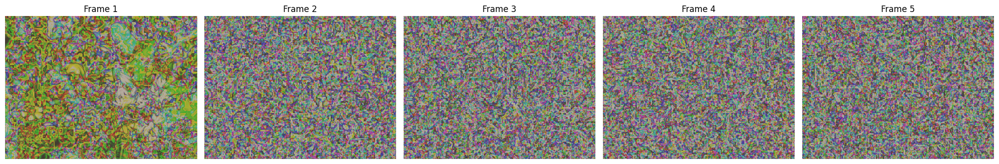

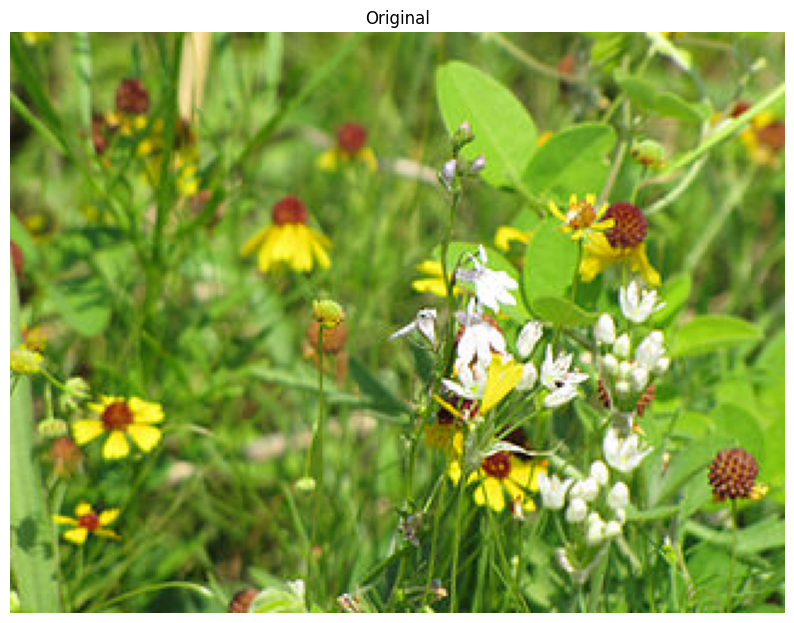

In [26]:
# Display the animation frames
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, ax in enumerate(axes):
    ax.imshow(animation_frames[i])
    ax.set_title(f"Frame {i+1}")
    ax.axis('off')
plt.tight_layout()
plt.show()

# Initialize a new model instance
dreamer = DeepDreamModel()

# Prepare input image
input_img = np.array(Image.open(img_path).convert('RGB'))
img_tensor = dreamer.preprocess(input_img)

# Apply dreaming manually
layer_name = 'inception_4c/output'
iterations = 10
learning_rate = 0.01

# Display original
plt.figure(figsize=(10, 8))
plt.imshow(input_img)
plt.title('Original')
plt.axis('off')
plt.show()

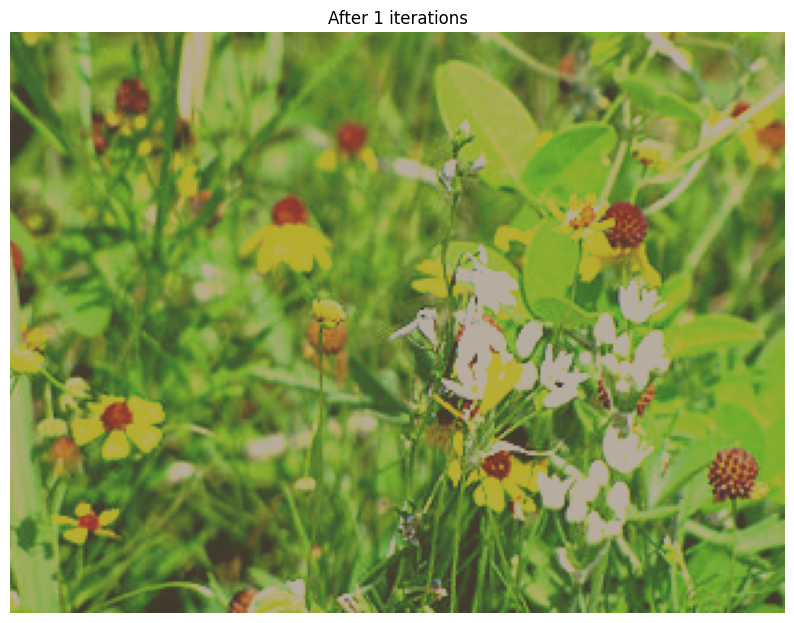

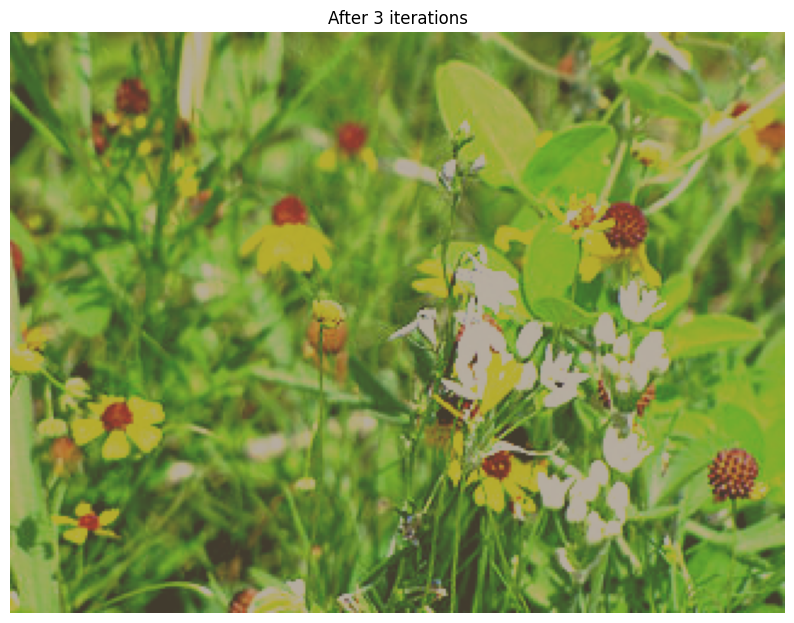

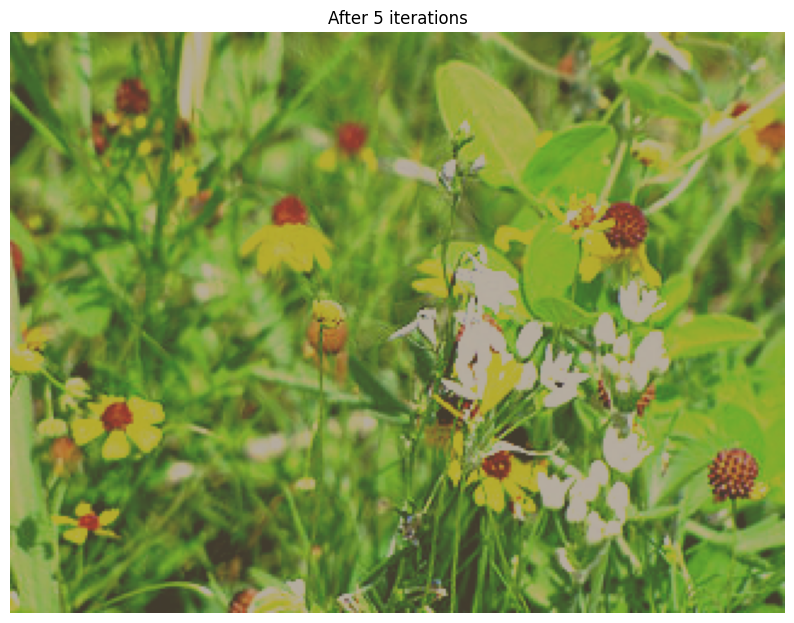

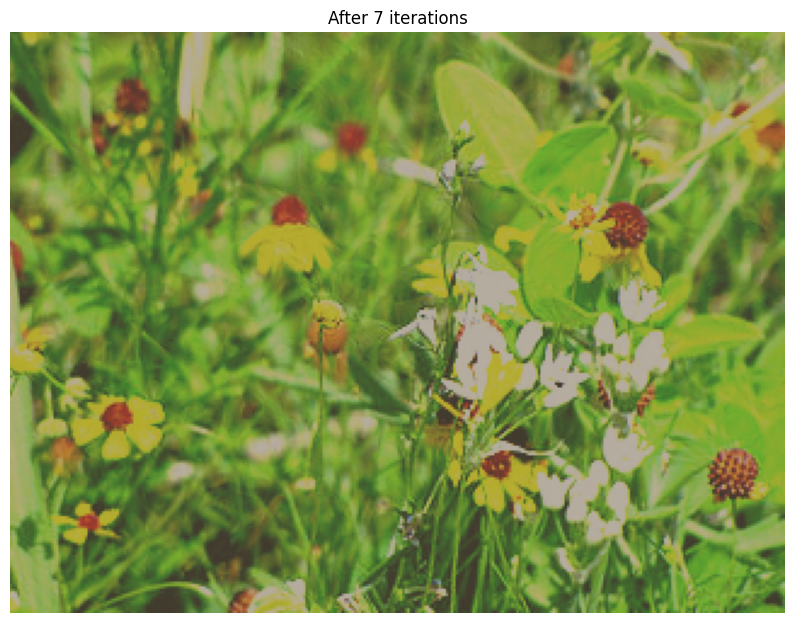

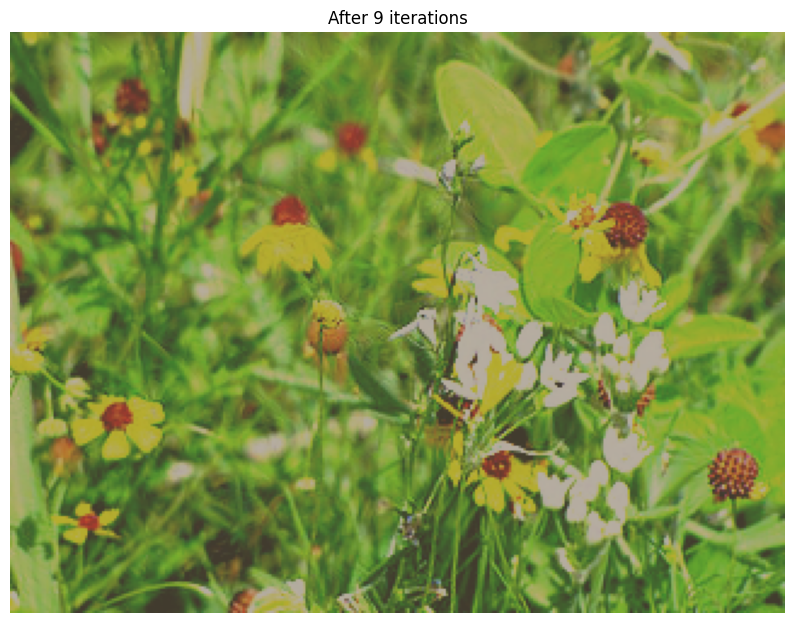

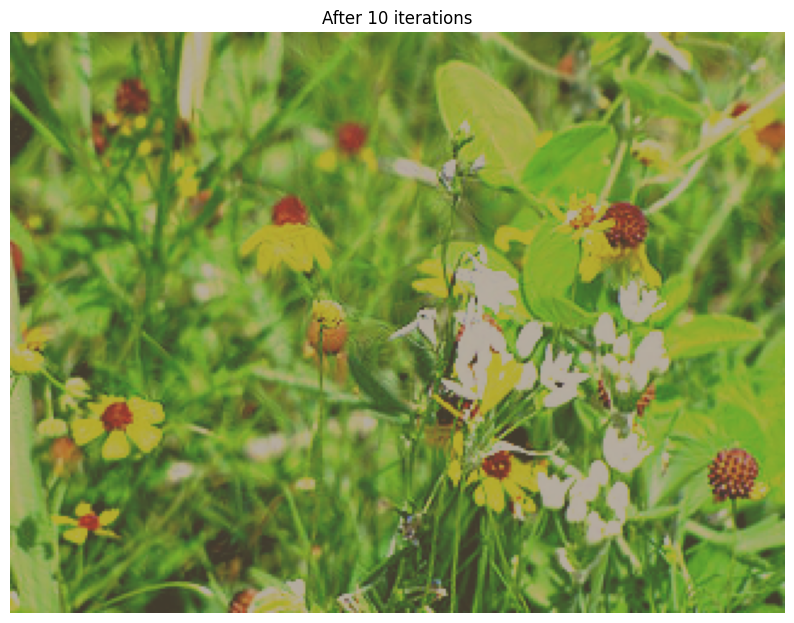

In [27]:
for i in range(iterations):
    # Use dream_step instead of dream
    img_tensor = dreamer.dream_step(img_tensor, layer_name, lr=learning_rate)
    
    # Display intermediate result every few iterations
    if i % 2 == 0 or i == iterations - 1:
        result = dreamer.deprocess(img_tensor)
        plt.figure(figsize=(10, 8))
        plt.imshow(result)
        plt.title(f'After {i+1} iterations')
        plt.axis('off')
        plt.show()


Running experiment: Few iterations (3), Normal learning rate (0.01)
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 3/3 [00:00<00:00, 114.99it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 3/3 [00:00<00:00, 101.94it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 3/3 [00:00<00:00, 105.41it/s]

Processing octave 4/4 - resolution: 240x320



100%|██████████| 3/3 [00:00<00:00, 111.09it/s]


Dream image saved to ./results/experiment_3iters_0.01lr.jpg


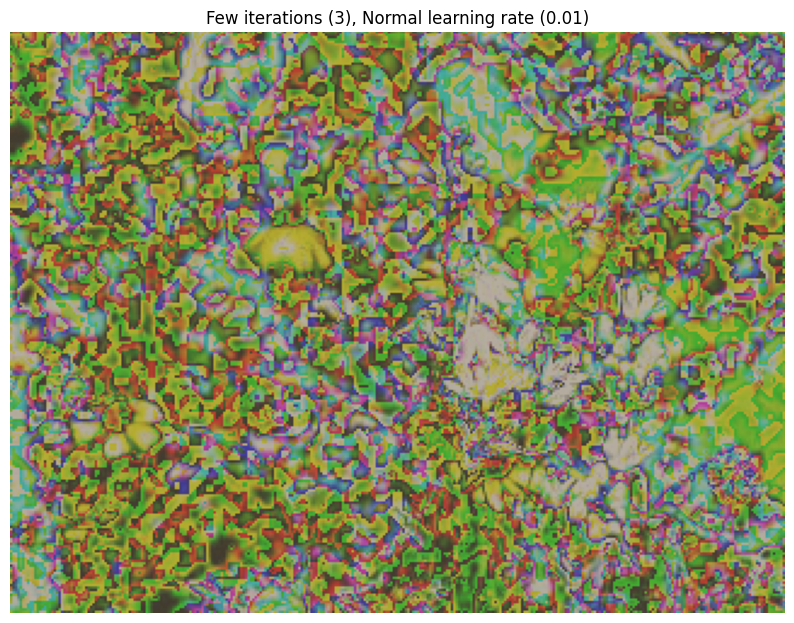


Running experiment: More iterations (10), Normal learning rate (0.01)
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 10/10 [00:00<00:00, 124.81it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 10/10 [00:00<00:00, 107.22it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 10/10 [00:00<00:00, 100.07it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 10/10 [00:00<00:00, 105.13it/s]


Dream image saved to ./results/experiment_10iters_0.01lr.jpg


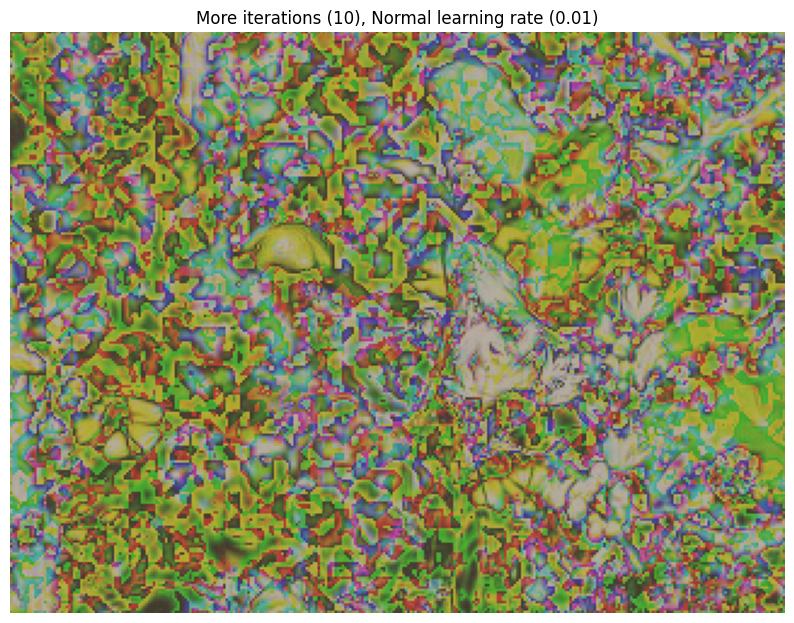


Running experiment: Normal iterations (5), Low learning rate (0.005)
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 88.94it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 100.20it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 99.29it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 94.50it/s]


Dream image saved to ./results/experiment_5iters_0.005lr.jpg


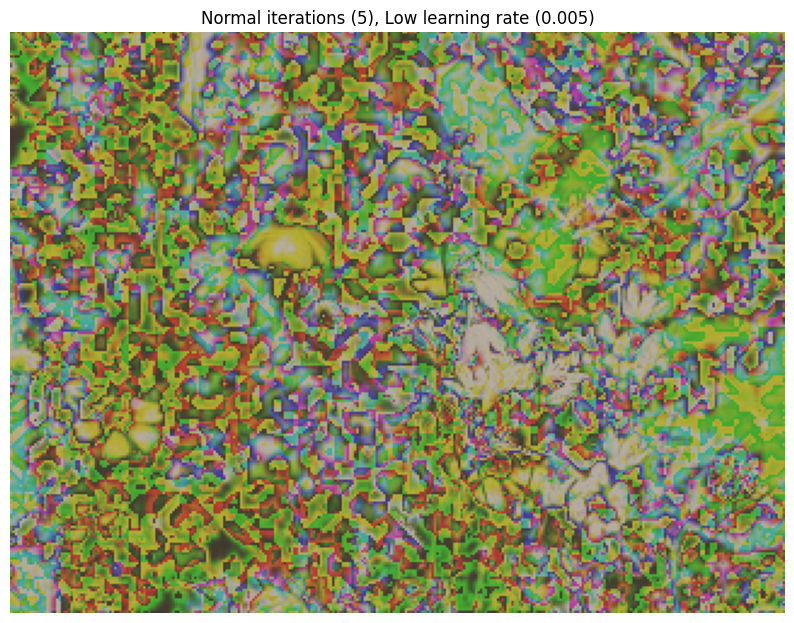


Running experiment: Normal iterations (5), High learning rate (0.02)
Input image shape: (240, 320, 3)
Processing octave 1/4 - resolution: 87x117


100%|██████████| 5/5 [00:00<00:00, 123.59it/s]


Processing octave 2/4 - resolution: 122x164


100%|██████████| 5/5 [00:00<00:00, 116.51it/s]


Processing octave 3/4 - resolution: 171x229


100%|██████████| 5/5 [00:00<00:00, 91.92it/s]


Processing octave 4/4 - resolution: 240x320


100%|██████████| 5/5 [00:00<00:00, 106.28it/s]


Dream image saved to ./results/experiment_5iters_0.02lr.jpg


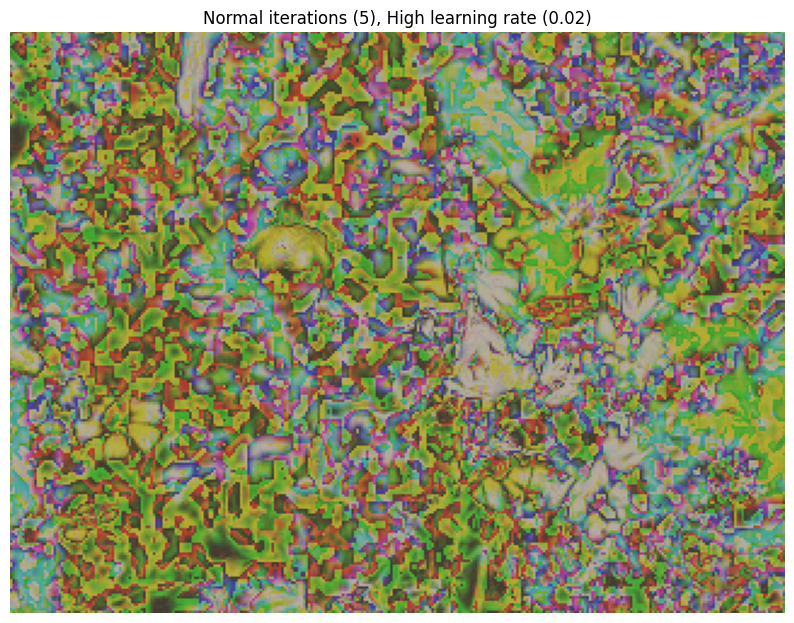

In [28]:
# Parameter grid for experimentation
experiments = [
    {'iterations': 3, 'lr': 0.01, 'title': 'Few iterations (3), Normal learning rate (0.01)'},
    {'iterations': 10, 'lr': 0.01, 'title': 'More iterations (10), Normal learning rate (0.01)'},
    {'iterations': 5, 'lr': 0.005, 'title': 'Normal iterations (5), Low learning rate (0.005)'},
    {'iterations': 5, 'lr': 0.02, 'title': 'Normal iterations (5), High learning rate (0.02)'}
]

# Run experiments
layer = 'inception_4c/output'
for exp in experiments:
    print(f"\nRunning experiment: {exp['title']}")
    
    result = deep_dream(
        img_path,
        output_path=f"./results/experiment_{exp['iterations']}iters_{exp['lr']}lr.jpg",
        layer=layer,
        octave_n=4,
        octave_scale=1.4,
        iterations=exp['iterations'],
        lr=exp['lr']
    )
    
    # Display result
    plt.figure(figsize=(10, 8))
    plt.imshow(np.array(result))
    plt.title(exp['title'])
    plt.axis('off')
    plt.show()